In [1]:
import networkx as nx
from evsim.classes.flowsim_dataset import FlowSimDataset
import matplotlib.colors as mcolors
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style("darkgrid")

dataset = FlowSimDataset(
    "/home/olimar/github_repos/EvMatsim/contribs/ev/scenario_examples/utah_flow_scenario_example/utahnetwork.xml",
    "/home/olimar/github_repos/EvMatsim/contribs/ev/scenario_examples/utah_flow_scenario_example/utahcounts.xml",
    100,)

df = pd.read_csv("output_10c/ITERS/it.10/10.countscompare.txt", sep="\t")

/home/olimar/miniconda3/envs/matsimenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset.edge_mapping['100']

2

In [3]:
df['Link Id'].unique()

array([ 100, 1002, 1003, ...,  995,  996,  999])

/home/olimar/miniconda3/envs/matsimenv/lib/python3.10/site-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


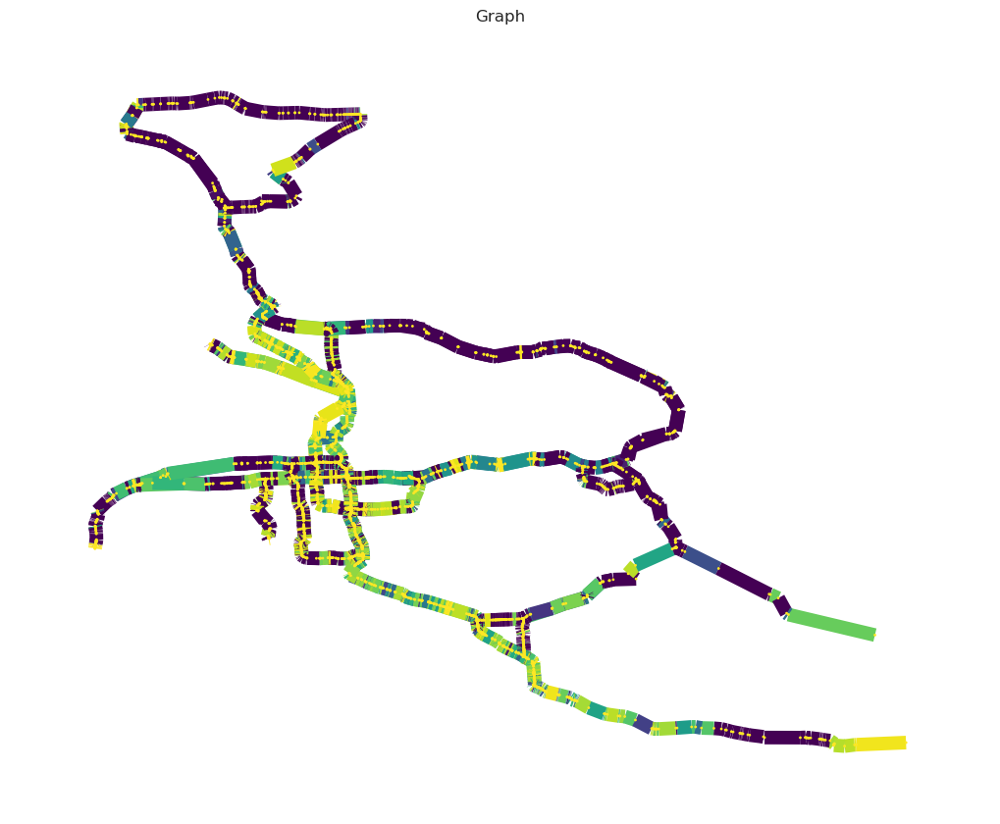

In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx

# Create the graph using the provided data
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G = nx.Graph()

# Add edges to the graph
for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        attribute = df[df['Link Id'] == int(sensor_idxs[i])]['Normalized Relative Error'].values[0]
        G.add_edge(u, v, weight=attribute)
    else:
        G.add_edge(u, v)

# Get the positions for the nodes
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Draw edges with colors based on weights
edges = G.edges()
weights = [G[u][v]['weight'] if 'weight' in G[u][v] else 0 for u, v in edges]
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
cmap = plt.cm.viridis
edge_colors = [cmap(norm(weight)) for weight in weights]

# Draw nodes with colors based on their degree
node_colors = [cmap(norm(G.degree(node))) for node in G.nodes()]
# 

# Plotting the graph
plt.figure(figsize=(10, 8))
nx.draw(G, pos, node_size=1, node_color=node_colors, edge_color=edge_colors, with_labels=False, cmap=cmap, width=10)

plt.title("Graph")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.show()


Text(0, 0.5, 'Y Coordinate')

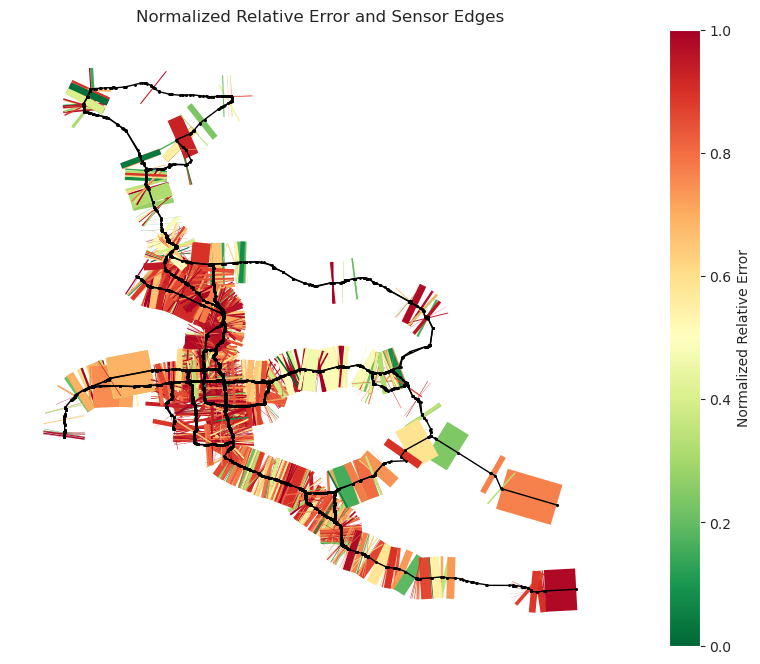

In [5]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx

# Create the graph using the provided data
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_normal = nx.Graph()
G_sensor = nx.Graph()

# Add edges to the respective graphs
for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        attribute = df[df['Link Id'] == int(sensor_idxs[i])]['Normalized Relative Error'].values[0]
        G_sensor.add_edge(u, v, weight=attribute)
    # else:
    G_normal.add_edge(u, v)

# Plotting both graphs on the same plot
fig, ax = plt.subplots(figsize=(10, 8))
# Get the positions for the nodes
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Plot the sensor edges (with colors based on weights)
edges_sensor = G_sensor.edges()
weights = [G_sensor[u][v]['weight'] if 'weight' in G_sensor[u][v] else 0 for u, v in edges_sensor]
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
cmap = plt.cm.RdYlGn  # red and green colormap
# invert the colormap
cmap = cmap.reversed()
edge_colors_sensor = [cmap(norm(weight)) for weight in weights]

# Plot sensor graph with colored edges
nx.draw(G_sensor, pos, ax=ax, node_size=1, node_color='black', edge_color=edge_colors_sensor, with_labels=False, cmap=cmap, width=30)

# Plot the normal edges (without any color) on top of the sensor graph
nx.draw(G_normal, pos, ax=ax, node_size=1, node_color='black', edge_color='black', with_labels=False, width=1)

# Add a color bar to the right
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Normalized Relative Error")

# Title and labels
ax.set_title("Normalized Relative Error and Sensor Edges")
ax.set_xlabel("X Coordinate")
ax.set_ylabel("Y Coordinate")


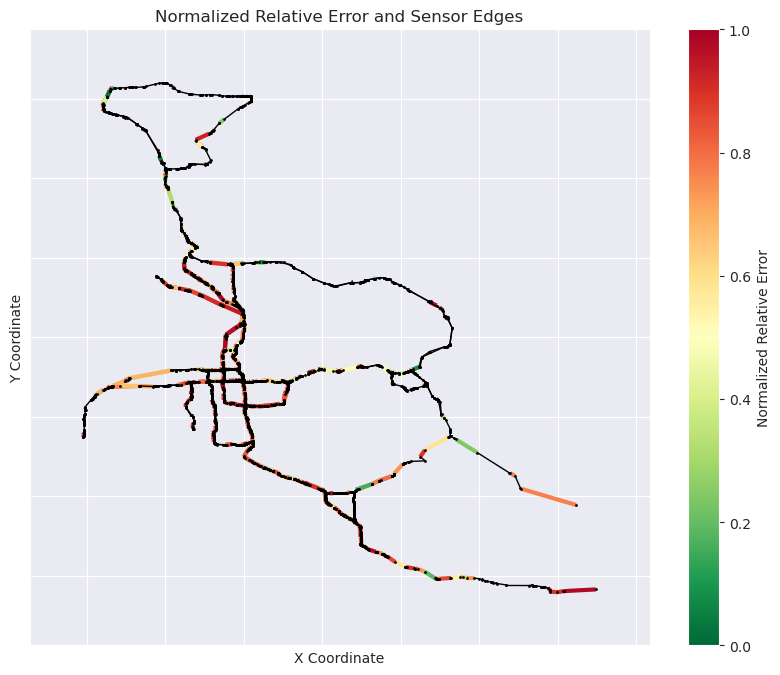

In [25]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Create the graph
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_sensor = nx.Graph()

# Add edges with full attributes
for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    
    if i in sensor_keys:
        link_id = int(sensor_idxs[i])
        df_row = df[df['Link Id'] == link_id].iloc[0]
        attributes = df_row.to_dict()
        G_sensor.add_edge(u, v, **attributes)
    else:
        G_sensor.add_edge(u, v)

# Plotting
fig, ax = plt.subplots(figsize=(10, 8))

# Get positions for nodes
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Separate sensor edges (with 'Normalized Relative Error') and normal edges
edges_with_sensor = [(u, v) for u, v in G_sensor.edges() if 'Normalized Relative Error' in G_sensor[u][v]]
edges_without_sensor = [(u, v) for u, v in G_sensor.edges() if 'Normalized Relative Error' not in G_sensor[u][v]]

# Extract corresponding weights
weights = [G_sensor[u][v]['Normalized Relative Error'] for u, v in edges_with_sensor]

# Handle empty weights safely
if len(weights) == 0:
    weights = [0]

# Normalize weights for colormap
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
cmap = plt.cm.RdYlGn.reversed()
edge_colors_sensor = [cmap(norm(weight)) for weight in weights]

# Draw sensor edges (colored)
nx.draw_networkx_edges(G_sensor, pos, edgelist=edges_with_sensor, edge_color=edge_colors_sensor, width=3, ax=ax)

# Draw non-sensor edges (black)
nx.draw_networkx_edges(G_sensor, pos, edgelist=edges_without_sensor, edge_color='black', width=1, ax=ax)

# Draw nodes
nx.draw_networkx_nodes(G_sensor, pos, node_size=1, node_color='black', ax=ax)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Normalized Relative Error")

# Title and labels
ax.set_title("Normalized Relative Error and Sensor Edges")
ax.set_xlabel("X Coordinate")
ax.set_ylabel("Y Coordinate")

plt.show()


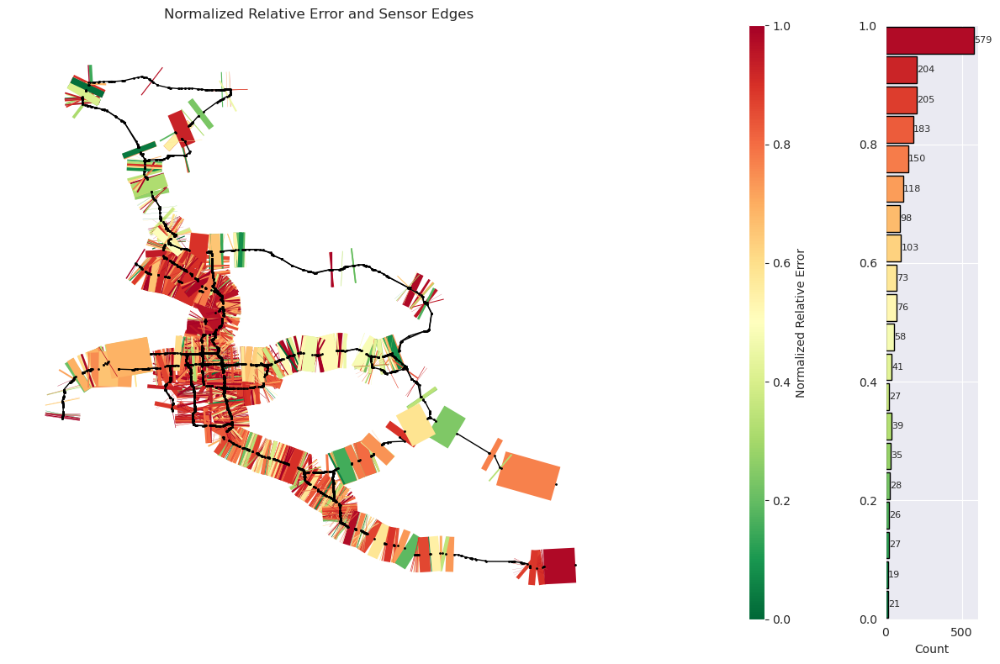

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import numpy as np

# Create the graph
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_sensor = nx.Graph()

hour_idx = 0

# Add edges with full attributes
for i in range(len(dataset.target_graph.edge_index[hour_idx])):
    u, v = dataset.target_graph.edge_index[hour_idx][i].item(), dataset.target_graph.edge_index[1][i].item()
    
    if i in sensor_keys:
        link_id = int(sensor_idxs[i])
        df_row = df[df['Link Id'] == link_id].iloc[hour_idx]
        attributes = df_row.to_dict()
        G_sensor.add_edge(u, v, **attributes)
    else:
        G_sensor.add_edge(u, v)

# Prepare plotting
fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(1, 5, width_ratios=[20, 0.25, .5, 0.3, 3])  # wider graph area

ax_graph = fig.add_subplot(gs[0])  # Main graph
ax_cbar = fig.add_subplot(gs[2])   # Colorbar
ax_hist = fig.add_subplot(gs[4], sharey=ax_cbar)  # Histogram

# Get positions for nodes
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Separate edges
edges_with_sensor = [(u, v) for u, v in G_sensor.edges() if 'Normalized Relative Error' in G_sensor[u][v]]
edges_without_sensor = [(u, v) for u, v in G_sensor.edges() if 'Normalized Relative Error' not in G_sensor[u][v]]

# Extract weights
weights = [G_sensor[u][v]['Normalized Relative Error'] for u, v in edges_with_sensor]
if len(weights) == 0:
    weights = [0]

# Normalize weights
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
cmap = plt.cm.RdYlGn.reversed()
edge_colors_sensor = [cmap(norm(weight)) for weight in weights]

# Draw graph
nx.draw_networkx_edges(G_sensor, pos, edgelist=edges_with_sensor, edge_color=edge_colors_sensor, width=30, ax=ax_graph)
nx.draw_networkx_edges(G_sensor, pos, edgelist=edges_without_sensor, edge_color='black', width=1, ax=ax_graph)
nx.draw_networkx_nodes(G_sensor, pos, node_size=1, node_color='black', ax=ax_graph)

ax_graph.set_title("Normalized Relative Error and Sensor Edges")
ax_graph.set_xlabel("X Coordinate")
ax_graph.set_ylabel("Y Coordinate")
ax_graph.set_axis_off()

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=ax_cbar)
cbar.set_label("Normalized Relative Error")

# Histogram
hist_vals, bins = np.histogram(weights, bins=20)
bar_centers = (bins[:-1] + bins[1:]) / 2
bar_heights = hist_vals
bar_width = (bins[1] - bins[0]) * 0.9

# Map bin centers to colors
bin_centers = (bins[:-1] + bins[1:]) / 2  # middle of each bin
colors = [cmap(norm(center)) for center in bin_centers]

ax_hist.barh(bar_centers, bar_heights, height=bar_width, align='center', color=colors, edgecolor='black')

# Add count labels at the top of each bar
for count, center in zip(bar_heights, bar_centers):
    ax_hist.text(count + 1, center, str(count), va='center', ha='left', fontsize=8)

ax_hist.set_xlabel('Count')
ax_hist.set_ylabel('')

# Adjust layout
plt.tight_layout()
plt.show()


In [8]:
# !pip install bokeh


In [9]:
from bokeh.plotting import figure, output_file, save
from bokeh.io import show
from bokeh.models import ColumnDataSource, ColorBar, LinearColorMapper, HoverTool
from bokeh.palettes import RdYlGn as colors
import networkx as nx
import pandas as pd
# Us ipynb to desplay the bokeh plot
from bokeh.io import output_notebook
output_notebook()

# Assuming 'dataset' and 'df' are already defined as per your provided code

# Create the graph using the provided data
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_normal = nx.Graph()
G_sensor = nx.Graph()

hour_idx = 0

# Add edges to the respective graphs
for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        attribute = df[df['Link Id'] == int(sensor_idxs[i])]['Normalized Relative Error'].values[hour_idx]
        G_sensor.add_edge(u, v, weight=attribute)
    else:
        G_normal.add_edge(u, v)

# Get the positions for the nodes
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Prepare the data for Bokeh
sensor_edges = list(G_sensor.edges())
normal_edges = list(G_normal.edges())

# Edge color mapping based on weights
sensor_weights = [G_sensor[u][v]['weight'] for u, v in sensor_edges]
min_weight = min(sensor_weights)
print(min_weight)
max_weight = max(sensor_weights)
print(max_weight)
# Create the figure
output_file("sensor_edges_graph.html")  # This will save the plot as an HTML file

p = figure(width=800, height=600, title="Normalized Relative Error and Sensor Edges")

# Create the color mapper for the edges based on the weight
color_mapper = LinearColorMapper(palette=colors[9], low=min_weight, high=max_weight)

# Create data sources for edges and nodes
edge_source_sensor = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in sensor_edges],
    y_start=[pos[u][1] for u, v in sensor_edges],
    x_end=[pos[v][0] for u, v in sensor_edges],
    y_end=[pos[v][1] for u, v in sensor_edges],
    weight=sensor_weights,
    link_id=[sensor_idxs[i] for i in sensor_keys],  # Store link_id for hover info
    count_station_id=[df[df['Link Id'] == int(sensor_idxs[i])]['Count Station Id'].values[hour_idx] for i in sensor_keys],
    hour=[df[df['Link Id'] == int(sensor_idxs[i])]['Hour'].values[hour_idx] for i in sensor_keys],
    matsim_volumes=[df[df['Link Id'] == int(sensor_idxs[i])]['MATSIM volumes'].values[hour_idx] for i in sensor_keys],
    count_volumes=[df[df['Link Id'] == int(sensor_idxs[i])]['Count volumes'].values[hour_idx] for i in sensor_keys],
    relative_error=[df[df['Link Id'] == int(sensor_idxs[i])]['Relative Error'].values[hour_idx] for i in sensor_keys],
    normalized_relative_error=[df[df['Link Id'] == int(sensor_idxs[i])]['Normalized Relative Error'].values[hour_idx] for i in sensor_keys],
    geh=[df[df['Link Id'] == int(sensor_idxs[i])]['GEH'].values[hour_idx] for i in sensor_keys]
))

# Draw sensor edges with colors based on weights
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=10, line_color={'field': 'weight', 'transform': color_mapper}, source=edge_source_sensor)
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1, line_color="black", source=edge_source_sensor)

# Create a normal edge source for drawing
edge_source_normal = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in normal_edges],
    y_start=[pos[u][1] for u, v in normal_edges],
    x_end=[pos[v][0] for u, v in normal_edges],
    y_end=[pos[v][1] for u, v in normal_edges],
))

# Draw the normal edges (without coloring)
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1, line_color="black", source=edge_source_normal)

# Add nodes (scatter plot)
node_x = [pos[i][0] for i in pos]
node_y = [pos[i][1] for i in pos]
p.scatter(node_x, node_y, size=5, color="black", alpha=0.2)

# Add a color bar
color_bar = ColorBar(color_mapper=color_mapper, width=8, location=(0, 0))
p.add_layout(color_bar, 'right')

# Create a HoverTool for the edges (to show 'Normalized Relative Error' and other attributes on hover)
hover_tool = HoverTool()
hover_tool.tooltips = [
    ("Link ID", "@link_id"),
    ("Count Station Id", "@count_station_id"),
    ("Hour", "@hour"),
    ("MATSIM Volumes", "@matsim_volumes"),
    ("Count Volumes", "@count_volumes"),
    ("Relative Error", "@relative_error"),
    ("Normalized Relative Error", "@normalized_relative_error"),
    ("GEH", "@geh")
]

# Add the hover tool to the plot
p.add_tools(hover_tool)

# Set labels and title
p.xaxis.axis_label = "X Coordinate"
p.yaxis.axis_label = "Y Coordinate"
p.title.text_font_size = "12pt"

# Show the plot
show(p)


Loading BokehJS ...

0.0
1.0


In [10]:

# Save the plot as an HTML file
save(p)

print("Plot saved as 'sensor_edges_graph.html'")

# Optionally show the plot (interactive in Jupyter Notebook)
# show(p)


Plot saved as 'sensor_edges_graph.html'


In [11]:
from bokeh.plotting import figure, output_file, show
from bokeh.models import ColumnDataSource, ColorBar, LinearColorMapper, HoverTool, Select, CustomJS
from bokeh.layouts import column
from bokeh.palettes import RdYlGn as colors
import networkx as nx
import pandas as pd
from bokeh.io import output_notebook

output_notebook()

# --- Your data setup ---
# Assume dataset, df are preloaded
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_normal = nx.Graph()
G_sensor = nx.Graph()

# Precompute all hour data
all_hours = list(range(0, 24))
print(all_hours)

pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}
sensor_edges = []
fields = ['count_station_id', 'hour', 'matsim_volumes', 'count_volumes', 'relative_error', 'normalized_relative_error', 'geh']
sensor_data_all_hours = {field: [] for field in fields}
sensor_weights_all_hours = []

for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        sensor_edges.append((u, v))
        link_id = int(sensor_idxs[i])
        for hour in all_hours:
            sensor_weights_all_hours.append(df[df['Link Id'] == link_id]['Normalized Relative Error'].values[hour])
            for field, col in zip(fields, ['Count Station Id', 'Hour', 'MATSIM volumes', 'Count volumes', 'Relative Error', 'Normalized Relative Error', 'GEH']):
                sensor_data_all_hours[field].append(df[df['Link Id'] == link_id][col].values[hour])
    else:
        G_normal.add_edge(u, v)

# Setup plot
output_file("sensor_edges_graph.html")
p = figure(width=800, height=600, title="Normalized Relative Error and Sensor Edges")

color_mapper = LinearColorMapper(palette=colors[9], low=min(sensor_weights_all_hours), high=max(sensor_weights_all_hours))

# Organize the data source
edge_source_sensor = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in sensor_edges],
    y_start=[pos[u][1] for u, v in sensor_edges],
    x_end=[pos[v][0] for u, v in sensor_edges],
    y_end=[pos[v][1] for u, v in sensor_edges],
    weight=[sensor_weights_all_hours[i] for i in range(0, len(sensor_edges))],
    weight_all_hours=[sensor_weights_all_hours[i::len(sensor_edges)] for i in range(len(sensor_edges))],
    **{field: [sensor_data_all_hours[field][i] for i in range(0, len(sensor_edges))] for field in fields},
    **{field + "_all_hours": [sensor_data_all_hours[field][i::len(sensor_edges)] for i in range(len(sensor_edges))] for field in fields},
))

# Draw sensor edges
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=10,
          line_color={'field': 'weight', 'transform': color_mapper},
          source=edge_source_sensor)
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1,
          line_color="black", source=edge_source_sensor)

# Normal edges
normal_edges = list(G_normal.edges())
edge_source_normal = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in normal_edges],
    y_start=[pos[u][1] for u, v in normal_edges],
    x_end=[pos[v][0] for u, v in normal_edges],
    y_end=[pos[v][1] for u, v in normal_edges],
))
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1,
          line_color="black", source=edge_source_normal)

# Nodes
node_x = [pos[i][0] for i in pos]
node_y = [pos[i][1] for i in pos]
p.scatter(node_x, node_y, size=5, color="black", alpha=0.2)

# Color bar
color_bar = ColorBar(color_mapper=color_mapper, width=8, location=(0, 0))
p.add_layout(color_bar, 'right')

# Hover tool
hover_tool = HoverTool()
hover_tool.tooltips = [
    ("Count Station Id", "@count_station_id"),
    ("Hour", "@hour"),
    ("MATSIM Volumes", "@matsim_volumes"),
    ("Count Volumes", "@count_volumes"),
    ("Relative Error", "@relative_error"),
    ("Normalized Relative Error", "@normalized_relative_error"),
    ("GEH", "@geh")
]
p.add_tools(hover_tool)

# Dropdown menu to select hour
hour_selector = Select(title="Select Hour", value="0", options=[str(i) for i in all_hours])

callback = CustomJS(args=dict(source=edge_source_sensor, hour_selector=hour_selector), code=f"""
    var data = source.data;
    var hour = parseInt(hour_selector.value);
    var n = data['weight_all_hours'].length;
    
    for (var i = 0; i < n; i++) {{
        data['weight'][i] = data['weight_all_hours'][i][hour];
        {"".join([f"data['{field}'][i] = data['{field}_all_hours'][i][hour];" for field in fields])}
    }}
    source.change.emit();
""")

hour_selector.js_on_change('value', callback)

layout = column(hour_selector, p)
show(layout)


Loading BokehJS ...

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [13]:
from bokeh.plotting import figure, output_file, show
from bokeh.models import ColumnDataSource, ColorBar, LinearColorMapper, HoverTool, Select, CustomJS
from bokeh.layouts import column
from bokeh.palettes import RdYlGn as colors
import networkx as nx
import pandas as pd
from bokeh.io import output_notebook

output_notebook()

# --- Assume dataset and df are preloaded ---
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_normal = nx.Graph()
G_sensor = nx.Graph()

# Precompute all hour data
all_hours = list(range(24))

pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}
sensor_edges = []
fields = ['count_station_id', 'hour', 'matsim_volumes', 'count_volumes', 'relative_error', 'normalized_relative_error', 'geh']
sensor_data_all_hours = {field: [] for field in fields}
sensor_weights_all_hours = []

for i in range(len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        sensor_edges.append((u, v))
        link_id = int(sensor_idxs[i])
        for hour in all_hours:
            sensor_weights_all_hours.append(df[df['Link Id'] == link_id]['Normalized Relative Error'].values[hour])
            for field, col in zip(fields, ['Count Station Id', 'Hour', 'MATSIM volumes', 'Count volumes', 'Relative Error', 'Normalized Relative Error', 'GEH']):
                sensor_data_all_hours[field].append(df[df['Link Id'] == link_id][col].values[hour])
    else:
        G_normal.add_edge(u, v)

# Setup plot
output_file("sensor_edges_graph.html")
p = figure(width=800, height=600, title="Normalized Relative Error and Sensor Edges")

color_mapper = LinearColorMapper(palette=colors[9], low=min(sensor_weights_all_hours), high=max(sensor_weights_all_hours))

# Setup data source
edge_source_sensor = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in sensor_edges],
    y_start=[pos[u][1] for u, v in sensor_edges],
    x_end=[pos[v][0] for u, v in sensor_edges],
    y_end=[pos[v][1] for u, v in sensor_edges],
    weight=[sensor_weights_all_hours[i] for i in range(0, len(sensor_edges))],
    weight_all_hours=[sensor_weights_all_hours[i::len(sensor_edges)] for i in range(len(sensor_edges))],
    **{field: [sensor_data_all_hours[field][i] for i in range(0, len(sensor_edges))] for field in fields},
    **{field + "_all_hours": [sensor_data_all_hours[field][i::len(sensor_edges)] for i in range(len(sensor_edges))] for field in fields},
))

# Draw sensor edges
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=10,
          line_color={'field': 'weight', 'transform': color_mapper},
          source=edge_source_sensor)
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1,
          line_color="black", source=edge_source_sensor)

# Draw normal edges
normal_edges = list(G_normal.edges())
edge_source_normal = ColumnDataSource(data=dict(
    x_start=[pos[u][0] for u, v in normal_edges],
    y_start=[pos[u][1] for u, v in normal_edges],
    x_end=[pos[v][0] for u, v in normal_edges],
    y_end=[pos[v][1] for u, v in normal_edges],
))
p.segment('x_start', 'y_start', 'x_end', 'y_end', line_width=1,
          line_color="black", source=edge_source_normal)

# Draw nodes
node_x = [pos[i][0] for i in pos]
node_y = [pos[i][1] for i in pos]
p.scatter(node_x, node_y, size=5, color="black", alpha=0.2)

# Add color bar
color_bar = ColorBar(color_mapper=color_mapper, width=8, location=(0, 0))
p.add_layout(color_bar, 'right')

# Hover tool with dynamic update
hover_tool = HoverTool()
hover_tool.tooltips = [
    ("Count Station Id", "@count_station_id"),
    ("Hour", "@hour"),
    ("MATSIM Volumes", "@matsim_volumes"),
    ("Count Volumes", "@count_volumes"),
    ("Relative Error", "@relative_error"),
    ("Normalized Relative Error", "@normalized_relative_error"),
    ("GEH", "@geh")
]
p.add_tools(hover_tool)

# Hour selector dropdown
hour_selector = Select(title="Select Hour", value="0", options=[str(i) for i in all_hours])

# JavaScript callback to update source dynamically
callback = CustomJS(args=dict(source=edge_source_sensor, hour_selector=hour_selector), code="""
    var data = source.data;
    var hour = parseInt(hour_selector.value);
    var n = data['weight_all_hours'].length;
    
    for (var i = 0; i < n; i++) {
        data['weight'][i] = data['weight_all_hours'][i][hour];
        data['count_station_id'][i] = data['count_station_id_all_hours'][i][hour];
        data['hour'][i] = data['hour_all_hours'][i][hour];
        data['matsim_volumes'][i] = data['matsim_volumes_all_hours'][i][hour];
        data['count_volumes'][i] = data['count_volumes_all_hours'][i][hour];
        data['relative_error'][i] = data['relative_error_all_hours'][i][hour];
        data['normalized_relative_error'][i] = data['normalized_relative_error_all_hours'][i][hour];
        data['geh'][i] = data['geh_all_hours'][i][hour];
    }
    source.change.emit();
""")
hour_selector.js_on_change('value', callback)

# Final layout
layout = column(hour_selector, p)
show(layout)


Loading BokehJS ...

In [ ]:
import networkx as nx
import numpy as np
from tqdm import tqdm


# === PREPARE DATA ===

# Create graph
sensor_idxs = {dataset.edge_mapping[str(link_id)]: str(link_id) for link_id in df['Link Id'].unique()}
sensor_keys = list(sensor_idxs.keys())
G_sensor = nx.Graph()
G_normal = nx.Graph()

# Store all hours' attributes per edge
hour_count = 24  # Assume each row = 1 hour snapshot

print("Sensor Idx:", len(sensor_idxs))
print("Sensor Keys:", len(sensor_keys))
for i in tqdm(range(len(dataset.target_graph.edge_index[0])), desc="Building Graphs", total=len(dataset.target_graph.edge_index[0])):
    u, v = dataset.target_graph.edge_index[0][i].item(), dataset.target_graph.edge_index[1][i].item()
    if i in sensor_keys:
        attr_per_hour = []
        for h in range(hour_count):
            if i in sensor_keys:
                link_id = int(sensor_idxs[i])
                df_row = df[df['Link Id'] == link_id].iloc[h]
                attr_per_hour.append(df_row.to_dict())
            else:
                attr_per_hour.append({})
        
        G_sensor.add_edge(u, v, all_attrs=attr_per_hour)
    else:
        G_normal.add_edge(u, v)


Sensor Idx: 2270
Sensor Keys: 2270


Building Graphs:   0%|          | 0/5236 [00:00<?, ?it/s]

Building Graphs: 100%|██████████| 5236/5236 [00:22<00:00, 228.96it/s]


In [59]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, LinearColorMapper, ColorBar, HoverTool, CustomJS, Select
from bokeh.layouts import row, column
from bokeh.io import output_notebook
output_notebook()

# Positions
pos = {i: (dataset.target_graph.pos[i][0].item(), dataset.target_graph.pos[i][1].item()) for i in range(len(dataset.target_graph.pos))}

# Build Bokeh Data Source
edge_start = []
edge_end = []
x0s, y0s, x1s, y1s = [], [], [], []
weight_all_hours = []
other_attr_all_hours = {col: [] for col in df.columns if col != 'Link Id'}

print("Loop Sensor Edges:", G_sensor.edges(data=True))
for (u, v, data) in tqdm(G_sensor.edges(data=True), desc="Processing Sensor Edges", total=len(G_sensor.edges)):
    edge_start.append(u)
    edge_end.append(v)
    x0, y0 = pos[u]
    x1, y1 = pos[v]
    x0s.append(x0)
    y0s.append(y0)
    x1s.append(x1)
    y1s.append(y1)
    
    # For each attribute across hours
    weights = []
    attr_columns = {col: [] for col in df.columns if col != 'Link Id'}
    if not 'all_attrs' in data:
        continue
    for hour_attr in data['all_attrs']:
        if hour_attr:  # if exists
            weights.append(hour_attr['Normalized Relative Error'])
            for col in attr_columns:
                attr_columns[col].append(hour_attr[col])
        else:
            weights.append(0)
            for col in attr_columns:
                attr_columns[col].append(0)
    
    weight_all_hours.append(weights)
    for col in attr_columns:
        other_attr_all_hours[col].append(attr_columns[col])

# Create ColumnDataSource
sensors_edge_source = ColumnDataSource(data=dict(
    x0=x0s, y0=y0s, x1=x1s, y1=y1s,
    weight=[w[0] for w in weight_all_hours],  # Initially hour 0
    weight_all_hours=weight_all_hours,
    **{col: [other_attr_all_hours[col][i][0] for i in range(len(edge_start))] for col in other_attr_all_hours},
    **{f"{col}_all_hours": other_attr_all_hours[col] for col in other_attr_all_hours}
))
normal_edge_source = ColumnDataSource(data=dict(
    x0=[pos[u][0] for u, v in G_normal.edges()],
    y0=[pos[u][1] for u, v in G_normal.edges()],
    x1=[pos[v][0] for u, v in G_normal.edges()],
    y1=[pos[v][1] for u, v in G_normal.edges()],
))

# === CREATE FIGURE ===

color_mapper = LinearColorMapper(palette="RdYlGn11", low=0, high=1)

# plot = figure(title="Normalized Relative Error", width=800, height=600, tools="pan,wheel_zoom,box_zoom,reset,save")
plot = figure(title="Normalized Relative Error", width=800, height=600, tools="pan,wheel_zoom,box_zoom,reset,save")

# Draw edges for sensors
plot.segment('x0', 'y0', 'x1', 'y1', source=sensors_edge_source,
             line_width=10, color={'field': 'weight', 'transform': color_mapper})
# # Draw edges for normal
plot.segment('x0', 'y0', 'x1', 'y1', source=sensors_edge_source,
             line_width=1, color="black")
plot.segment('x0', 'y0', 'x1', 'y1', source=normal_edge_source,
             line_width=1, color="black")
# Draw nodes
node_x = [pos[i][0] for i in pos]
node_y = [pos[i][1] for i in pos]
plot.scatter(node_x, node_y, size=5, color="black", alpha=0.2)

# Add hover tool
tooltips = [(col, f"@{{{col}}}") for col in df.columns if col != 'Link Id']
tooltips.insert(0, ("Weight", "@weight"))

hover = HoverTool(tooltips=tooltips)
plot.add_tools(hover)

# Colorbar
color_bar = ColorBar(color_mapper=color_mapper, location=(0,0))
plot.add_layout(color_bar, 'right')

# === CREATE DROPDOWN TO SELECT HOUR ===

fields = [col for col in df.columns if col != 'Link Id']

hour_selector = Select(title="Select Hour", value="1", options=[str(i+1) for i in range(hour_count)])

callback = CustomJS(args=dict(source=sensors_edge_source, hour_selector=hour_selector), code=f"""
    var data = source.data;
    var hour = parseInt(hour_selector.value-1);
    var n = data['weight_all_hours'].length;

    for (var i = 0; i < n; i++) {{
        data['weight'][i] = data['weight_all_hours'][i][hour];
        {"".join([f"data['{field}'][i] = data['{field}_all_hours'][i][hour];" for field in fields])}
    }}
    source.change.emit();
""")

hour_selector.js_on_change('value', callback)

# === LAYOUT AND SHOW ===

layout = column(row(plot, hour_selector))
show(layout)


Loading BokehJS ...

Loop Sensor Edges: [(3263, 3262, {'all_attrs': [{'Link Id': 101.0, 'Count Station Id': 40000.0, 'Hour': 1.0, 'MATSIM volumes': 0.0, 'Count volumes': 130.0, 'Relative Error': -1.0, 'Normalized Relative Error': 1.0, 'GEH': 16.125}, {'Link Id': 101.0, 'Count Station Id': 40000.0, 'Hour': 2.0, 'MATSIM volumes': 0.0, 'Count volumes': 107.0, 'Relative Error': -1.0, 'Normalized Relative Error': 1.0, 'GEH': 14.629}, {'Link Id': 101.0, 'Count Station Id': 40000.0, 'Hour': 3.0, 'MATSIM volumes': 0.0, 'Count volumes': 101.0, 'Relative Error': -1.0, 'Normalized Relative Error': 1.0, 'GEH': 14.213}, {'Link Id': 101.0, 'Count Station Id': 40000.0, 'Hour': 4.0, 'MATSIM volumes': 0.0, 'Count volumes': 120.0, 'Relative Error': -1.0, 'Normalized Relative Error': 1.0, 'GEH': 15.492}, {'Link Id': 101.0, 'Count Station Id': 40000.0, 'Hour': 5.0, 'MATSIM volumes': 0.0, 'Count volumes': 198.0, 'Relative Error': -1.0, 'Normalized Relative Error': 1.0, 'GEH': 19.9}, {'Link Id': 101.0, 'Count Station Id': 40000

Processing Sensor Edges: 100%|██████████| 2110/2110 [00:00<00:00, 12878.60it/s]


In [60]:
# Save the plot as an HTML file
save(layout)

print("Plot saved as 'sensor_edges_graph.html'")


Plot saved as 'sensor_edges_graph.html'
